# Welcome to OpenVINO(TM) Hands-on Lab Session 2 - End to End Video Applications

This lab contains brief tutorials how we can enable OpenVINO(TM) Toolkit Inference Engine and integrate it into an end to end video analytics application. We will use Python code snippets to show integration details.

Jupyter notebook is a browser based IDE and allows partial code executions and text based inputs as markdown at each cell.

Please follow the notations for each instruction in the following sections:

- If tutorial wants you run a certain command on terminal you will see the text as below. You should open a terminal or continue on the opened one as instructed. 

**Commands To Run on Terminal**
***
```bash
python3 
```
***

In Ubuntu, when you copy text, easiest way to paste code with keyboard is to press:

**SHIFT + INS** buttons

- If there are text looks like code; it is mainly the output of an example run of a sample code, please don't copy those back into terminal. 

**Example Terminal Output** 
***
``` output ```
***

- If you see python code inside the cell like below, take focus to cell by clicking to it then press:

**SHIFT + ENTER** 

or Click on `>| Run` run button above.

Below example is a code block, which you can run inside this browser session and see the output directly below the cell. You don't need to copy the code to terminal or any other IDE.

In [1]:
import numpy as np

arr1 = np.zeros(5)
print('Array 1 ', arr1)

arr2 = np.ones(5)
print('Array 2', arr2)

# Array Product 
print(arr1 * arr2)

Array 1  [0. 0. 0. 0. 0.]
Array 2 [1. 1. 1. 1. 1.]
[0. 0. 0. 0. 0.]


# Agenda

In this hands-on lab session, we aim to show how a video application is being developed using OpenCV* and how we can change inference implementation to integrate Intel(R) Distribution of OpenVINO(TM) Toolkit.

We have developed a Python application using OpenCV* and OpenVINO(TM) Python APIs to run real-time object detections with on given video source, at each part we will also show the utilities in the tutorial using the sample application. Please see the source code from [`samples/object_detection_multi_platform.py`](samples/object_detection_multi_platform.py) file.

Below list is the agenda of this lab session. 

## Part 1 - Inference with OpenCV*
At this section, we make a quick introduction to OpenCV* and do inference with OpenCV* DNN library

## Part 2 - Inference Engine Integration
This part contains a complete Python application which is using OpenCV and OpenVINO(TM) Toolkit for object detection application. Here you can analyze the code to see how the integration has been made for a OpenCV* application.

## Part 3 - Inference Engine - ASync API 
At this section we will run Inference Engine ASync API to see how async inference can be used. This part includes code samples to run inside Jupyter Notebook. 

## Part 4 - Inference Engine - Dynamic Batching
Finally, we will investigate Dynamic Batching at this section.

## Part 5 - Use of Multiple DL Models in a Video Application
In this part, we will run Interactive Face Detection sample application delivered with OpenVINO(TM) to see how multiple models can be used with OpenVINO(TM).

## Part 6 - Object Detection with YOLOv3 Model 
In this part, we will utilize the YOLOv3 model and use it for object detection. At the first part of this section, we will convert YOLO model to IR files, then will run the sample applications with YOLOv3 model.

**Notes**

- Output values are only samples, they can vary according to used hardware.
- *Other names and brands names, may be claimed as the property of others.

# Part 1: Inference with OpenCV*

OpenCV* implements DNN (Deep Neural Network) library to help you work with Caffe*, Tensorflow*, Yolo* models for inference. 

In this section, we will use OpenCV and show how inference work on OpenCV step by step.

## 1 - Import OpenCV library to access method calls. 

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

In [2]:
import cv2 as cv
import matplotlib.pyplot as plt
import time

print('SUCCESS')

SUCCESS


## 2 - Load Deep Learning Model

`readNetFromCaffe` method loads the `.caffemodel` and `.prototxt` files to create DNN network object which can be used to complete inference.

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

In [3]:
network = cv.dnn.readNetFromCaffe('/home/intel/openvino_models/object_detection/common/mobilenet-ssd/caffe/mobilenet-ssd.prototxt', 
                                  '/home/intel/openvino_models/object_detection/common/mobilenet-ssd/caffe/mobilenet-ssd.caffemodel')

print('SUCCESS')

SUCCESS


## 3 - Set Inference Backend and Target Device

Set Inference Backend Implementation and Target Device. 

With the latest implementations and updates, OpenCV* DNN library implements open source version of OpenVINO(TM). Therefore, by default it can uses Inference Engine backend and can be configured with `cv.dnn` flags.

`cv.dnn.DNN_BACKEND_INFERENCE_ENGINE`

See: https://docs.opencv.org/3.4/d6/d0f/group__dnn.html 

For, comparison reasons we setup backend as OpenCV implementation `DNN_BACKEND_OPENCV` and target as CPU.

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

In [4]:
network.setPreferableBackend(cv.dnn.DNN_BACKEND_OPENCV)
network.setPreferableTarget(cv.dnn.DNN_TARGET_CPU)

print('SUCCESS')

SUCCESS


## 4 - Loading Image and Video with OpenCV*

OpenCV* has various utility methods to play with images.  

For single image, we can just use `cv2.imread('path_to_image')`

When it comes to Video or Camera, `cv2.VideoCapture` object is pretty handy to read all the frames from capture.

`capture = cv2.VideoCapture('file_name')` will load the video file or `capture = cv2.VideoCapture(0)` will use the attached video device from your platform. 

`capture.read()` can be used to read each from the video stream as below:

`has_frame, next_frame = cap.read()` so, with an endless loop you can read frames until you don't get any frames.

Load image to infer. You can also download an image to reuse, so all you need to is change `images/car.png` to the path of the image you downloaded. 

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

In [5]:
frame = cv.imread('images/car.png')

print('SUCCESS')

SUCCESS


## 5 - Preprocess Inputs

At this stage, we prepare input layer for the network. OpenCV* DNN has `blobFromImage` method to create binary object in memory to ready for inference.

MobileNet-SSD Model requires images sized `224x224` and normalized with scale factor `(1/256)` and mean substruction from all channels `127.` 

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

In [6]:
model_width = 224
model_height = 224

initial_w = frame.shape[1]
initial_h = frame.shape[0]

resized_frame = cv.resize(frame, (model_height, model_width))

scale_factor = 1/256.
mean_value = 127.

# MobileNetSSD Expects 224x224 resized frames
blob = cv.dnn.blobFromImage(resized_frame,
                            scale_factor,
                            (model_height, model_width),
                            (mean_value, mean_value, mean_value))

print('SUCCESS')

SUCCESS


## 6 - Run Inference

Now, we can run inference with `forward` method. First, we feed `blob` then run forward-propagation to get detection results from OpenCV* DNN network. 

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

In [7]:
# Send blob data to Network
inference_start = time.time()
network.setInput(blob)
# Make network do a forward propagation to get recognition matrix
res = network.forward()
inference_end = time.time()

inference_time = (inference_end - inference_start)

print('Elapsed Inference Time: \n', round(inference_time, 5), ' seconds\n', round(inference_time * 1000, 5), ' milliseconds')

print('\nSUCCESS')

Elapsed Inference Time: 
 0.07474  seconds
 74.73803  milliseconds

SUCCESS


## 7 - Post Processing

We have inference results in `res` object, in this final stage, we do post-processing with the inference data using `placeBoxes` method and show inference time and results. 

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

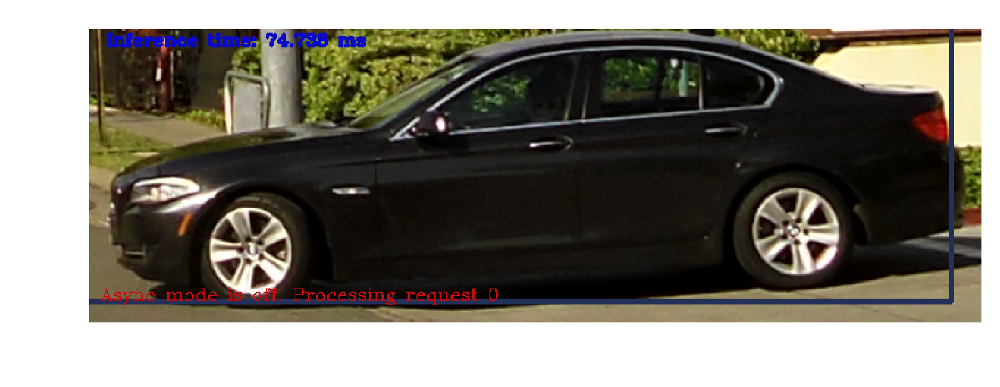

In [8]:
# Post Process 
# For labeling the image after inference.
from utils.out_process import placeBoxes

confidence_threshold = 0.6

frame = placeBoxes(res, 
                   None, 
                   confidence_threshold, 
                   frame, initial_w, initial_h, 
                   False, 0, inference_time)

# We use pyplot because it plays nicer with Jupyter Notebooks
fig = plt.figure(dpi=300)
ax = fig.add_subplot(111)
ax.imshow(cv.cvtColor(frame, cv.COLOR_BGR2RGB), interpolation='none')
plt.axis("off")
plt.show()

## Run Video/Webcam Inference with OpenCV

Let's run our Python application only using OpenCV* utilities and see how does it work with video or camera. Python application utilizes the information above to run the inference with OpenCV*. 

In order to run the application you have to open a new terminal `CTRL + ALT + T` and paste below command.

### Inference with OpenCV on a Video

****

```bash
python3 /home/intel/Workshop/samples/object_detection_multi_platform.py --framework caffe --device CPU --backend OPENCV_DNN --mconfig /home/intel/openvino_models/object_detection/common/mobilenet-ssd/caffe/mobilenet-ssd.prototxt --mweight /home/intel/openvino_models/object_detection/common/mobilenet-ssd/caffe/mobilenet-ssd.caffemodel --mlabels /home/intel/Workshop/models/ssd_labels.txt -i offline --source /home/intel/Workshop/videos/cars_1900.mp4 --model_image_height 224 --model_image_width 224 --confidence 0.60
```

****

### Inference with OpenCV on Webcam

****

```bash
python3 /home/intel/Workshop/samples/object_detection_multi_platform.py --framework caffe --device CPU --backend OPENCV_DNN --mconfig /home/intel/openvino_models/object_detection/common/mobilenet-ssd/caffe/mobilenet-ssd.prototxt --mweight /home/intel/openvino_models/object_detection/common/mobilenet-ssd/caffe/mobilenet-ssd.caffemodel --mlabels /home/intel/Workshop/models/ssd_labels.txt -i live --source 0 --model_image_height 224 --model_image_width 224 --confidence 0.60
```

****

Video window will be opened and detected objects will be rectangled. You will also notice the CPU use and FPS ratios/

![window_snippet](images/opencv_output.png)

# Part 2: Inference Engine Integration

If you already covered Introduction to OpenVINO(TM) Toolkit - Lab 1 tutorial, it basically does the same operations as OpenCV* does but inference part is different than the OpenCV. 

In this part, we will run the object_detection_multi_platform.py application with Inference Engine integration. 

In previous part, we run the application with OpenCV* inference utility, below commands runs application with OpenVINO(TM) Toolkit Inference Engine integration so we will see how they work with different hardware targets at each section.

### Open a new terminal (CTRL + ALT + T) then copy paste the commands as indicated and evaluate the source code and see the performance resuls as shown on the terminal and the output window

## 1 - Run OpenVINO(TM) CPU Inference

Copy below command to terminal and run to see inference results.

***
```bash
python3 /home/intel/Workshop/samples/object_detection_multi_platform.py --framework openvino --device CPU --mconfig /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP32/mobilenet-ssd.xml --mweight /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP32/mobilenet-ssd.bin --mlabels /home/intel/Workshop/models/ssd_labels.txt -i offline --source /home/intel/Workshop/videos/cars_1900.mp4 --model_image_height 224 --model_image_width 224 --confidence 0.60
```
***

## 2 - Run OpenVINO(TM) GPU Inference with FP32 

Copy below command to terminal and run to see inference results.

***
```bash
python3 /home/intel/Workshop/samples/object_detection_multi_platform.py --framework openvino --device GPU --mconfig /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP32/mobilenet-ssd.xml --mweight /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP32/mobilenet-ssd.bin --mlabels /home/intel/Workshop/models/ssd_labels.txt -i offline --source /home/intel/Workshop/videos/cars_1900.mp4 --model_image_height 224 --model_image_width 224 --confidence 0.60
```
***


## 3 - Run OpenVINO(TM) GPU Inference with FP16 

Copy below command to terminal and run to see inference results.

***
```bash
python3 /home/intel/Workshop/samples/object_detection_multi_platform.py --framework openvino --device GPU --mconfig /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP16/mobilenet-ssd.xml --mweight /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP16/mobilenet-ssd.bin --mlabels /home/intel/Workshop/models/ssd_labels.txt -i offline --source /home/intel/Workshop/videos/cars_1900.mp4 --model_image_height 224 --model_image_width 224 --confidence 0.60
```
***


## 4 - Run OpenVINO(TM) Myriad X Inference with FP16

Copy below command to terminal and run to see inference results.

***
```bash
python3 /home/intel/Workshop/samples/object_detection_multi_platform.py --framework openvino --device MYRIAD --mconfig /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP16/mobilenet-ssd.xml --mweight /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP16/mobilenet-ssd.bin --mlabels /home/intel/Workshop/models/ssd_labels.txt -i offline --source /home/intel/Workshop/videos/cars_1900.mp4 --model_image_height 224 --model_image_width 224 --confidence 0.60
```
***


# Part 3: Inference Engine ASync API

In previous sections we used inference in synchronous manner with `infer` calls. We get the results and feeded new input image to perform forward propagation. Inference Engine provides better utilization of asynchronous inferences to get more performance during the inferences. 

In this section, we will replicate the Inference Engine API use with asynchronous calls and see how it works with its Python API.

At the end of the section, we will run the `object_detection_multi_platform.py` application with asynchronous inference.

## 1 - Libraries and Helper Methods 

This is a replica of first lab's Inference Engine part, we will reuse that portion as is, only the inference calls will change.

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

In [9]:
# Run code with : (SHIFT + ENTER) or Press Run Button #

# Let's Import Required Libraries first
import sys
import os
import time
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 

# Import OpenVINO
from openvino.inference_engine import IENetwork, IEPlugin

# For labeling the image
from utils.out_process import placeBoxes

labels_map = {0:'background',1: 'aeroplane', 2: 'bicycle', 3: 'bird', 4: 'boat', 5: 'bottle', 6: 'bus', 7: 'car', 8: 'cat',
              9: 'chair', 10: 'cow', 11: 'diningtable', 12: 'dog', 13: 'horse', 14: 'motorbike', 15: 'person', 16: 'pottedplant',
              17: 'sheep', 18: 'sofa', 19: 'train', 20: 'tvmonitor' }

# Define Methods
def createPlugin(target_device, extension_list):
    # Plugin initialization for specified device. We will be targeting CPU initially.
    plugin = IEPlugin(device=target_device)

    # Loading additional kernel extension libraries for the CPU
    if target_device == 'CPU':
        for extension in extension_list:
            plugin.add_cpu_extension('/home/intel/inference_engine_samples_build/intel64/Release/lib/libcpu_extension.so')

    return plugin

def createNetwork(model_xml, model_bin, plugin):
    # Importing network weights from IR models.

    net = IENetwork(model=model_xml, weights=model_bin)
        
    return net

def loadNetwork(plugin, net, num_requests=2):
    # Loading IR model to the plugin.
    exec_net = plugin.load(network=net, num_requests=num_requests)
    
    # Getting the input and outputs of the network
    input_blob = next(iter(net.inputs))
    out_blob = next(iter(net.outputs))
    
    return exec_net,input_blob,out_blob

print('SUCCESS')

SUCCESS


## 2 - Async Inference Implementation

The difference between asynchronous and synchronous is tracing the output of the given image, for synchronous implementation, we feed new image input when output is ready so we know which frame has the results. This is not true for asynchronous implementation. We will continuously feed input images and we should be able to recall what results belogs to what frame so we can process results accordingly.

Therefore, the main difference for asynchronous inference is tracing frames and their results so each frame should have an integer id so we can assign and get results of that image. 

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

### Code Analysis

#### 1. First, part gets a list of frames from video for the showcase, so skips 30 frames and gets a number of frames@

```python
frame_count = async_req_count * 3
    
# Frame Container
frame_list = list()
    
# Open Video File
cap = cv.VideoCapture(video_file)
    
# Read next frame_count number of frames
for i in range(frame_count):
    has_frame, frame = cap.read()
    frame_list.append(frame)
    # Skip 20 Frame
    for i in range(30):
        cap.read()
```

#### 2. We Create Executable Network using Helper Methods defined above, one more thing here that, we also had to determine number of asynchronous request counts.

```python
plugin = createPlugin(target_device=device,
           extension_list=['/home/intel/inference_engine_samples_build/intel64/Release/lib/libcpu_extension.so'])

net = createNetwork(model_xml, model_bin, plugin)
exec_net,input_blob,out_blob = loadNetwork(plugin, net, num_requests=async_req_count)
```

#### 3. We generate a queue to get images and assign ids for frames on the list and get the ids for the first two frames.

```python
request_ids = list()
request_ids = list(np.arange(0, async_req_count))

cur_request_id = request_ids.pop(0)
next_request_id = request_ids.pop(0)
```

#### 4. Then, we start inference for all the frames asynchronously. If there is a frame available we pre-process image and call the async inference.

```python
if frame_id < len(frame_list):                 
        current_frame = frame_list[frame_id]
        print('Async Request For Frame {}'.format(frame_id))

        n, c, h, w = net.inputs[input_blob].shape
        in_frame = cv.resize(current_frame, (w, h))
        in_frame = in_frame.transpose((2, 0, 1))  # Change data layout from HWC to CHW
        resized_frame = in_frame.reshape((n, c, h, w))

        inference_start = time.time()
        print('Request Inference for Frame Id {} with Request Id {}'.format(frame_id, next_request_id))
        # Starting the inference in async mode, which starts the inference in parallel
        inference_start_times[next_request_id] = inference_start
        exec_net.start_async(request_id=next_request_id, inputs={input_blob: resized_frame})
        request_frames[next_request_id] = current_frame

        print('Async Request {} Completed'.format(next_request_id))
        frame_id = frame_id + 1
```

#### 5. If inference ready for previosly assigned Id then we can get the result for that frame.

```python
if exec_net.requests[cur_request_id].wait(-1) == 0:
            res = exec_net.requests[cur_request_id].outputs[out_blob]
            print('Request {} Inference Completed'.format(cur_request_id))
            detection_ends = time.time()
            inference_time = (detection_ends - inference_start_times[cur_request_id])
            
            # Processing the output result and adding labels on the image. Implementation is not shown in the
            #  this notebook; you can find it in object_detection_demo_ssd_async.py
            frame = request_frames[cur_request_id]
            initial_w = frame.shape[1]
            initial_h = frame.shape[0]

            frame = placeBoxes(res, labels_map, confidence_threshold, frame, initial_w, initial_h, True, cur_request_id, det_time=inference_time)
            # We use pyplot because it plays nicer with Jupyter Notebooks
            fig = plt.figure(dpi=300)
            ax = fig.add_subplot(111)
            ax.imshow(cv.cvtColor(frame, cv.COLOR_BGR2RGB), interpolation='none')
            plt.axis("off")
            plt.show()
        
            all_processed = all_processed - 1

```

Please see method which is used for asynchronous inference.

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

In [10]:
# Async Inference Sample
def runInferenceAsync(device='CPU', 
                      model_xml='/home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP32/mobilenet-ssd.xml', 
                      model_bin='/home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP32/mobilenet-ssd.bin',
                      video_file='videos/cars_1900.mp4',
                      async_req_count = 3,
                      confidence_threshold=0.6):
    
    # Read async_req_count * 3 frames
    frame_count = async_req_count * 3
    
    # Frame Container
    frame_list = list()
    
    # Open Video File
    cap = cv.VideoCapture(video_file)
    
    # Read next frame_count number of frames
    for i in range(frame_count):
        has_frame, frame = cap.read()
        frame_list.append(frame)
        # Skip 20 Frame
        for i in range(30):
            cap.read()
    
    print('Read {} Frames'.format(len(frame_list)))
    # Create IEPlugin, IENetwork and ExecutableNetwork
    plugin = createPlugin(target_device=device,
                               extension_list=['/home/intel/inference_engine_samples_build/intel64/Release/lib/libcpu_extension.so'])
    net = createNetwork(model_xml, model_bin, plugin)
    exec_net,input_blob,out_blob = loadNetwork(plugin, net, num_requests=async_req_count)
    print('Finished Loading IE Network')
    
    # Create a Queue for Request Ids range to async_req_count
    request_ids = list()
    request_ids = list(np.arange(0, async_req_count))
    
    # This is to measure times for each request.
    inference_start_times = dict()
    request_frames = dict()
    # Assign request ids 
    cur_request_id = request_ids.pop(0)
    next_request_id = request_ids.pop(0)
    
    # Read All Frames and Start Async Inference for each
    frame_id = 0
    all_processed = len(frame_list)
    while all_processed > 0:
        if frame_id < len(frame_list):                 
            current_frame = frame_list[frame_id]
            print('Async Request For Frame {}'.format(frame_id))
            
            n, c, h, w = net.inputs[input_blob].shape
            in_frame = cv.resize(current_frame, (w, h))
            in_frame = in_frame.transpose((2, 0, 1))  # Change data layout from HWC to CHW
            resized_frame = in_frame.reshape((n, c, h, w))
            
            inference_start = time.time()
            print('Request Inference for Frame Id {} with Request Id {}'.format(frame_id, next_request_id))
            # Starting the inference in async mode, which starts the inference in parallel
            inference_start_times[next_request_id] = inference_start
            exec_net.start_async(request_id=next_request_id, inputs={input_blob: resized_frame})
            request_frames[next_request_id] = current_frame
            
            print('Async Request {} Completed'.format(next_request_id))
            frame_id = frame_id + 1
        
        # Get Inference of Last Request Id
        if exec_net.requests[cur_request_id].wait(-1) == 0:
            res = exec_net.requests[cur_request_id].outputs[out_blob]
            print('Request {} Inference Completed'.format(cur_request_id))
            detection_ends = time.time()
            inference_time = (detection_ends - inference_start_times[cur_request_id])
            
            # Processing the output result and adding labels on the image. Implementation is not shown in the
            #  this notebook; you can find it in object_detection_demo_ssd_async.py
            frame = request_frames[cur_request_id]
            initial_w = frame.shape[1]
            initial_h = frame.shape[0]

            frame = placeBoxes(res, labels_map, confidence_threshold, frame, initial_w, initial_h, True, cur_request_id, det_time=inference_time)
            # We use pyplot because it plays nicer with Jupyter Notebooks
            fig = plt.figure(dpi=300)
            ax = fig.add_subplot(111)
            ax.imshow(cv.cvtColor(frame, cv.COLOR_BGR2RGB), interpolation='none')
            plt.axis("off")
            plt.show()
        
            all_processed = all_processed - 1

        request_ids.append(cur_request_id)
        cur_request_id = next_request_id
        next_request_id = request_ids.pop(0)
            
    return None

print('SUCCESS')

SUCCESS


## 3 - Run Async Inference on CPU

Run Async Inference on CPU

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

Read 9 Frames
Finished Loading IE Network
Async Request For Frame 0
Request Inference for Frame Id 0 with Request Id 1
Async Request 1 Completed
Async Request For Frame 1
Request Inference for Frame Id 1 with Request Id 2
Async Request 2 Completed
Request 1 Inference Completed


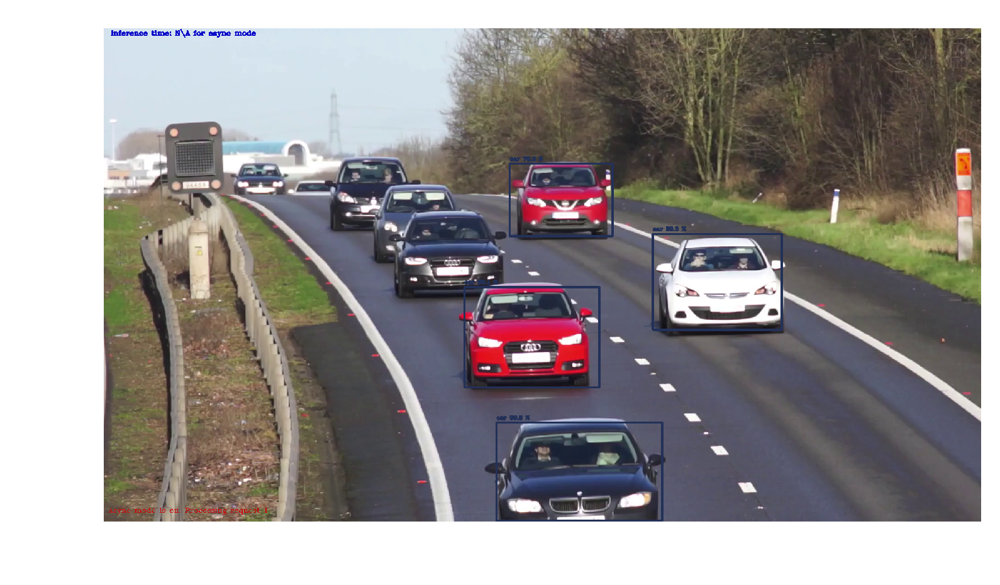

Async Request For Frame 2
Request Inference for Frame Id 2 with Request Id 0
Async Request 0 Completed
Request 2 Inference Completed


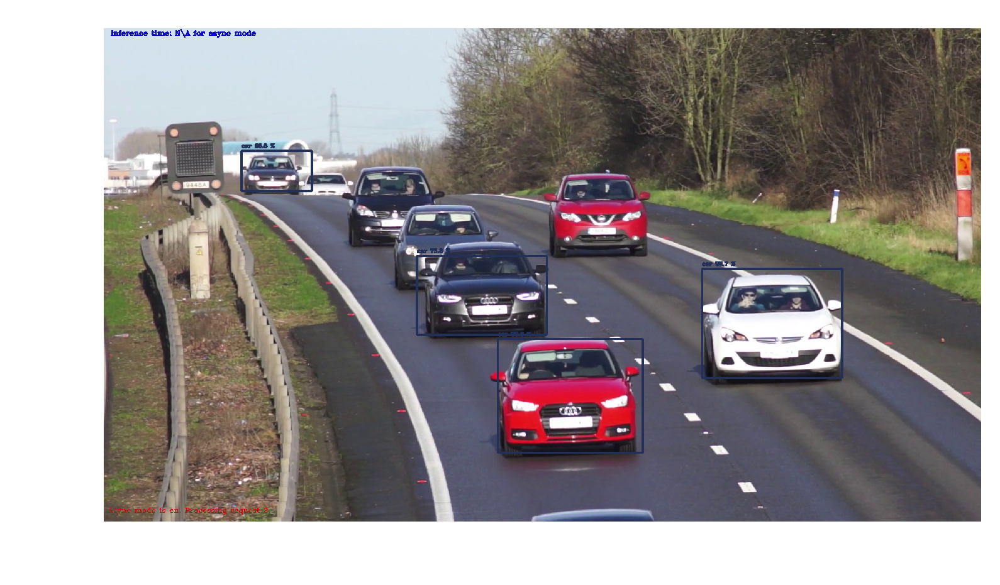

Async Request For Frame 3
Request Inference for Frame Id 3 with Request Id 1
Async Request 1 Completed
Request 0 Inference Completed


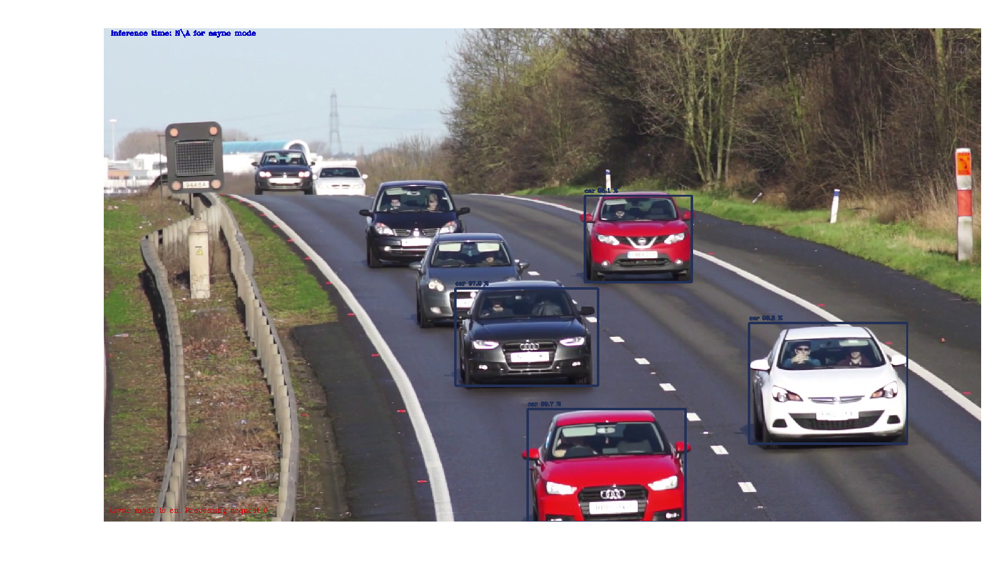

Async Request For Frame 4
Request Inference for Frame Id 4 with Request Id 2
Async Request 2 Completed
Request 1 Inference Completed


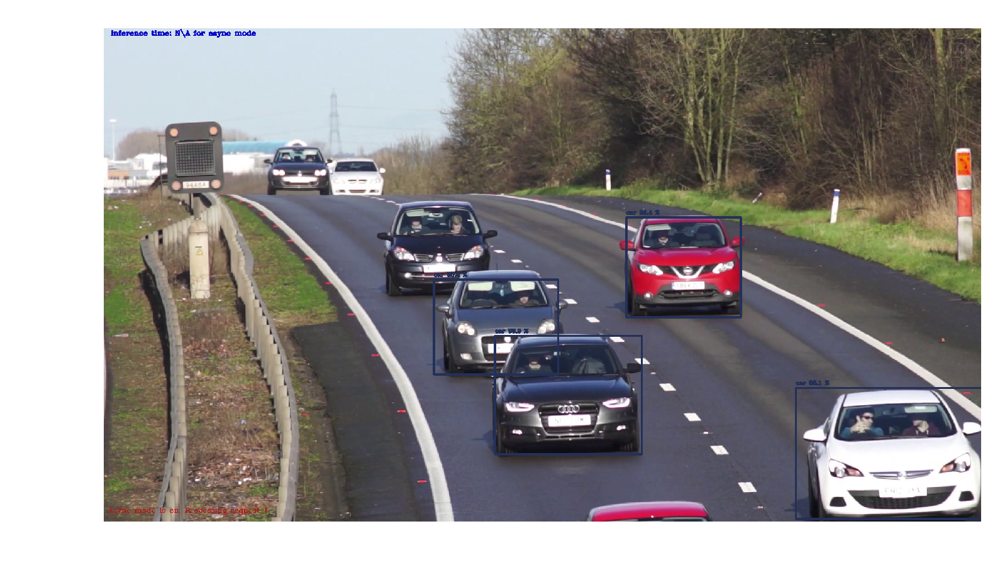

Async Request For Frame 5
Request Inference for Frame Id 5 with Request Id 0
Async Request 0 Completed
Request 2 Inference Completed


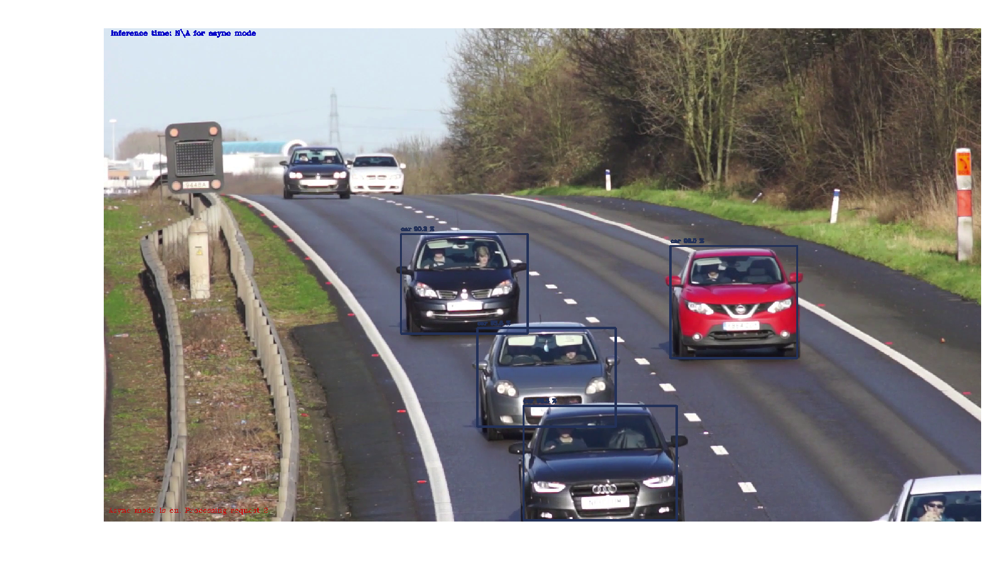

Async Request For Frame 6
Request Inference for Frame Id 6 with Request Id 1
Async Request 1 Completed
Request 0 Inference Completed


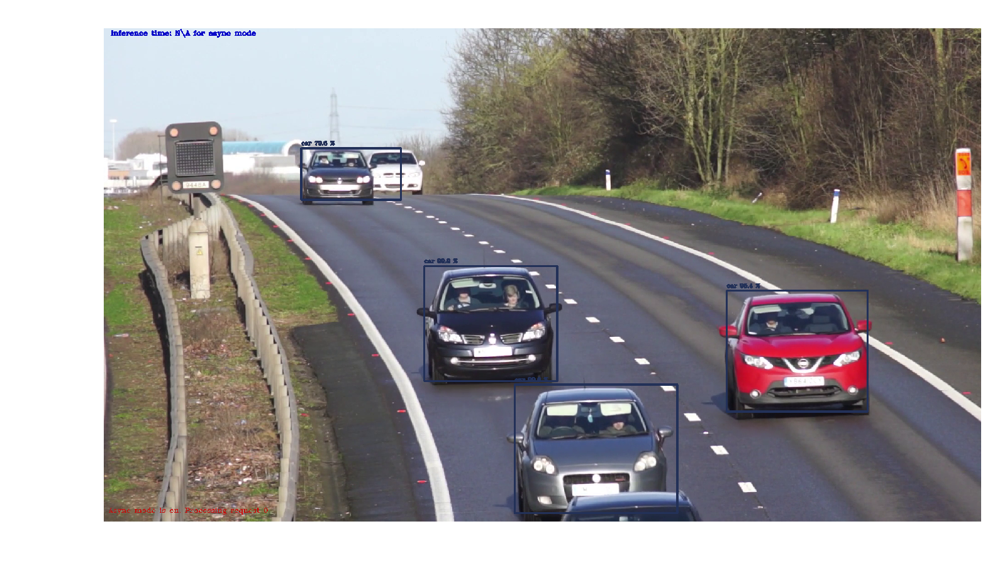

Async Request For Frame 7
Request Inference for Frame Id 7 with Request Id 2
Async Request 2 Completed
Request 1 Inference Completed


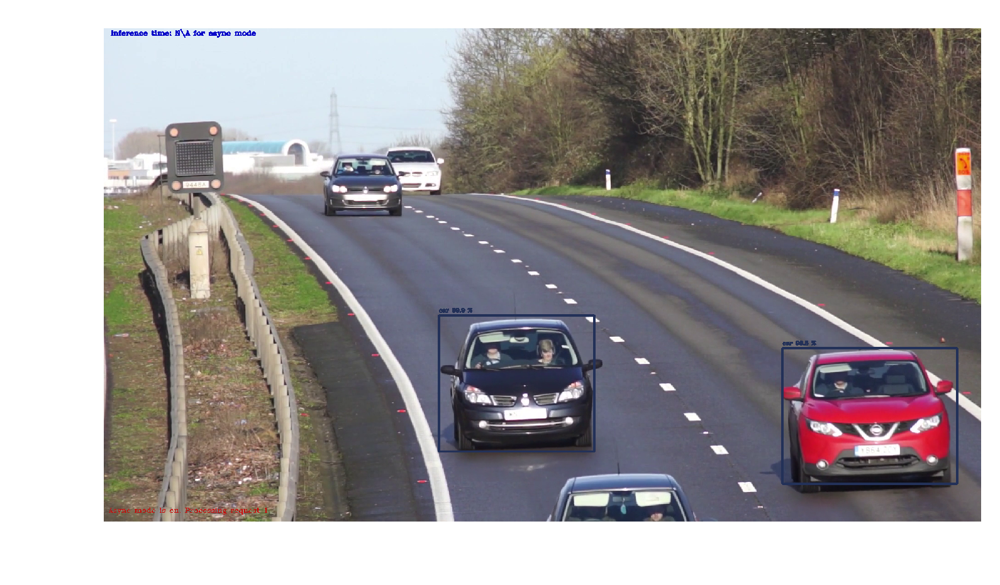

Async Request For Frame 8
Request Inference for Frame Id 8 with Request Id 0
Async Request 0 Completed
Request 2 Inference Completed


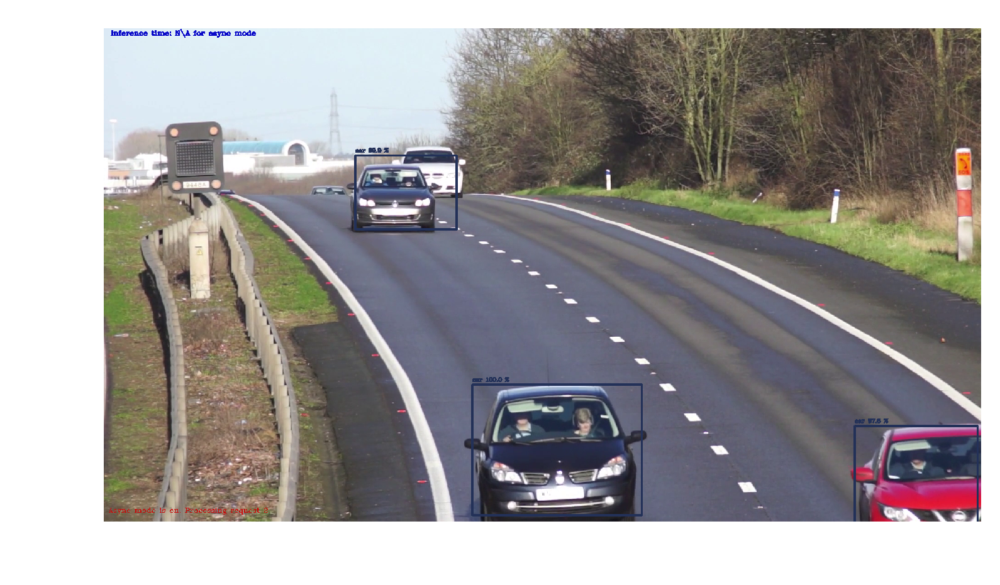

Request 0 Inference Completed


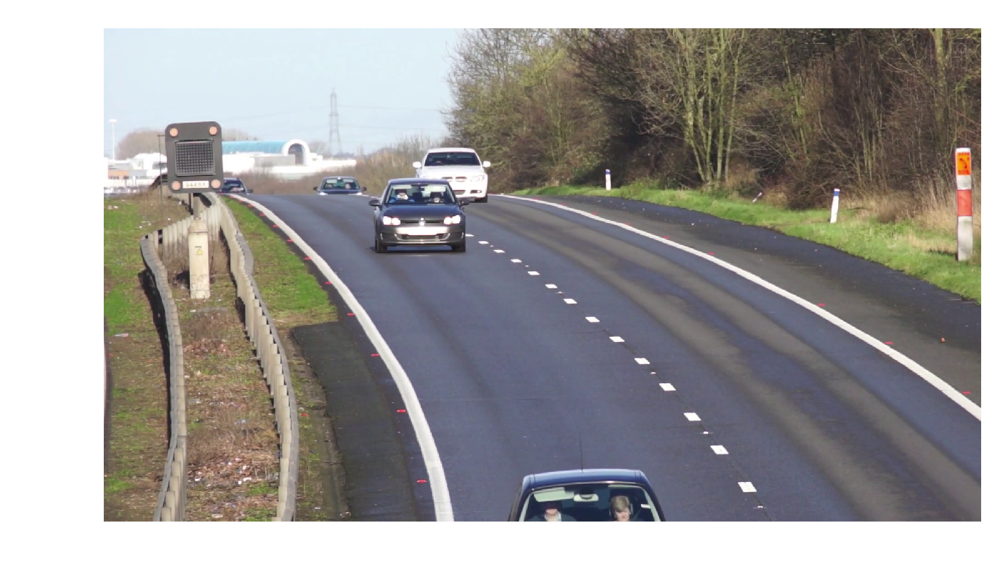

In [11]:
runInferenceAsync(device='CPU')

## 4 - Let's Test Asynchronous Inference with Python Application

It's better to use a video to see the actual performance boost. Most significant improvement will be on Myriad VPU. 

You can compare application performance in the previous section and this one to compare the performance improvement.

We will again use terminal to run below commands. Open a new terminal with `CTRL + ALT + T`

### ASync CPU Inference

***
```bash
python3 /home/intel/Workshop/samples/object_detection_multi_platform.py --framework openvino --device CPU --mconfig /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP32/mobilenet-ssd.xml --mweight /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP32/mobilenet-ssd.bin --mlabels /home/intel/Workshop/models/ssd_labels.txt -i offline --source /home/intel/Workshop/videos/cars_1900.mp4 --model_image_height 224 --model_image_width 224 --confidence 0.60 --async True --number_of_async_requests 20 
```
***

### ASync GPU Inference - FP32

****
```bash
python3 /home/intel/Workshop/samples/object_detection_multi_platform.py --framework openvino --device GPU --mconfig /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP32/mobilenet-ssd.xml --mweight /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP32/mobilenet-ssd.bin --mlabels /home/intel/Workshop/models/ssd_labels.txt -i offline --source /home/intel/Workshop/videos/cars_1900.mp4 --model_image_height 224 --model_image_width 224 --confidence 0.60 --async True --number_of_async_requests 20
```
***

### ASync GPU Inference - FP16

***
```bash
python3 /home/intel/Workshop/samples/object_detection_multi_platform.py --framework openvino --device GPU --mconfig /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP16/mobilenet-ssd.xml --mweight /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP16/mobilenet-ssd.bin --mlabels /home/intel/Workshop/models/ssd_labels.txt -i offline --source /home/intel/Workshop/videos/cars_1900.mp4 --model_image_height 224 --model_image_width 224 --confidence 0.60 --async True --number_of_async_requests 20
```
***


### ASync Myriad Inference

****
```bash
python3 /home/intel/Workshop/samples/object_detection_multi_platform.py --framework openvino --device MYRIAD --mconfig /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP16/mobilenet-ssd.xml --mweight /home/intel/openvino_models/models/object_detection/common/mobilenet-ssd/FP16/mobilenet-ssd.bin --mlabels /home/intel/Workshop/models/ssd_labels.txt -i offline --source /home/intel/Workshop/videos/cars_1900.mp4 --model_image_height 224 --model_image_width 224 --confidence 0.60 --async True --number_of_async_requests 20
```
****

# Part 4: Dynamic Batching Support

Dynamic batching with Inference Engine is used to provide input data with batches and let inference engine to handle inference process with underlying mechanishm. 

For example if you have N number of cameras and want to infer them in parallel, batch size N can be used. Maximum number of batch is limited to 16 at this time. 

- You need to create the batch first.
- Then need keep track of the batch indexes to relate inference output with frames.
- Here you have multiple inferences at the same time.

Below method, only reads 2 times of batch size for demonstration purposes. 

## 1

Implement `runInferenceBatch` Method which uses Hetero Plugin by Default and Dynamic Batching

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

In [14]:
# Run code with : (SHIFT + ENTER) or Press Run Button #

# For labeling the image after inference.
from utils.out_process import placeBoxes

# At this stage we implement our inference method to run with Heterogeneous plugin. 

def runInferenceBatch(hetero_device = 'HETERO:GPU,CPU',
                 model_xml='/home/intel/openvino_models/ir/mobilenet-ssd/FP32/mobilenet-ssd.xml',
                 model_bin='/home/intel/openvino_models/ir/mobilenet-ssd/FP32/mobilenet-ssd.bin',
                 video_file='videos/cars_1900.mp4',
                 batch_size = 8,
                 performance_counters = False,
                 dot_graph = True,
                 confidence_threshold=0.6):

    batch_count = 2
    frame_count = batch_size * batch_count
    
    frame_list = list()
    cap = cv.VideoCapture(video_file)
    
    for i in range(frame_count):
        has_frame, frame = cap.read()
        frame_list.append(frame)
        # Skip 20 Frame
        for i in range(20):
            cap.read()
        
    # Plugin initialization for specified device. We will be targeting CPU initially.
    plugin = IEPlugin(device=hetero_device, plugin_dirs='/opt/intel/openvino/deployment_tools/inference_engine/lib/intel64')
    
    # Heterogeneous Plugin is provided as
    #HETERO:GPU,CPU or similar.
    vals = hetero_device.split(':')
    targets = vals[1].split(',')
    
    # Let's check if heterogeneous plugin has CPU target so we can add cpu extensions
    # Loading additional exension libraries for the CPU
    if hetero_device == 'CPU' or ('CPU' in targets):
        extension_list=['/home/intel/inference_engine_samples_build/intel64/Release/lib/libcpu_extension.so']
        for extension in extension_list:
            plugin.add_cpu_extension(extension)
 
    net = createNetwork(model_xml, model_bin, plugin)
    net.batch_size = batch_size
     # Let's check if the target is heterogeneous then we add fallback device priorities
     #If we set TARGET_FALLBACK configuration, we want IE to decide what device to fallback. 
    
    plugin.set_initial_affinity(net)
    plugin.set_config({"TARGET_FALLBACK": hetero_device})
    
    if dot_graph:
        # Just for a show case, remove
        plugin.set_config({"HETERO_DUMP_GRAPH_DOT": "YES"})
    
    exec_net, input_blob, out_blob = loadNetwork(plugin, net)
    
    print(input_blob)
    print(out_blob)
    
    ## BATCHING 
    for b in range(batch_count):
        print('Running Batch #{} '.format(b))
        # Create numpy array for the max_batch size images
        n, c, h, w = net.inputs[input_blob].shape
        images = np.zeros(shape=(n, c, h, w))

        # Read and pre-process input images
        for i in range(n):
            image_idx = (batch_size * (b)) + i
            # print('Reading Image IDX {}'.format(image_idx))
            image = frame_list[image_idx]
            
            if image.shape[:-1] != (h, w):
                image = cv.resize(image, (w, h))
            image = image.transpose((2, 0, 1))  # Change data layout from HWC to CHW
            images[i] = image
            
        print("Batch size is {}".format(n))

        my_request_id = 0

            # Starting the inference in async mode, which starts the inference in parallel
        inference_start = time.time()
        exec_net.start_async(request_id=my_request_id, inputs={input_blob: images})
        # ... You can do additional processing or latency masking while we wait ...

        # Blocking wait for a particular request_id
        if exec_net.requests[my_request_id].wait(-1) == 0:
            # getting the result of the network
            res = exec_net.requests[my_request_id].outputs[out_blob]
            print(res.shape)
            inference_end = time.time()

            # Processing the output result and adding labels on the image. Implementation is not shown in the
            #  this notebook; you can find it in object_detection_demo_ssd_async.py
            for i in range(n):
                image_idx = (batch_size * (b)) + i
                
                original_frame = frame_list[image_idx]
                initial_w = original_frame.shape[1]
                initial_h = original_frame.shape[0]

                frame = placeBoxes(res, None, confidence_threshold, original_frame, initial_w, initial_h, False, my_request_id, ((inference_end - inference_start)), batch_id=i)
                # We use pyplot because it plays nicer with Jupyter Notebooks
                fig = plt.figure(dpi=300)
                ax = fig.add_subplot(111)
                print('Image ID {}'.format(image_idx))
                ax.imshow(cv.cvtColor(frame, cv.COLOR_BGR2RGB), interpolation='none')
                plt.axis("off")
                plt.show()
        else:
            print("There was an error with the request")

        if performance_counters:
            perf_counts = exec_net.requests[0].get_perf_counts()
            print("Performance counters:")
            for layer, stats in perf_counts.items():
                print(layer, ': ', stats)
    
    return (plugin, net, exec_net)

print('SUCCESS')

SUCCESS


In [15]:
# Run code with : (SHIFT + ENTER) or Press Run Button #

hetero_objects = runInferenceBatch(hetero_device = 'CPU',
                                   model_xml='/home/intel/openvino_models/ir/mobilenet-ssd/FP16/mobilenet-ssd.xml',
                                   model_bin='/home/intel/openvino_models/ir/mobilenet-ssd/FP16/mobilenet-ssd.bin')

IndexError: list index out of range

## 3

Show Layer Affinities

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

In [ ]:
# Run code with : (SHIFT + ENTER) or Press Run Button #

net = hetero_objects[1]

# This time all CPU, no need to fallback to GPU

for l in net.layers.values():
    print('Type: ', l.type, 'Device: ', l.affinity)

## 4

Show Corresponding Performance Counters

#### Change Focus to Below Cell and Press (SHIFT + ENTER) or Click on Run Button

In [ ]:
# Run code with : (SHIFT + ENTER) or Press Run Button #

# Get the exec net
exec_net = hetero_objects[2]

# Print the performance counteres
perf_counts = exec_net.requests[0].get_perf_counts()
print("Performance counters:")
for layer, stats in perf_counts.items():
    print(layer, ': ', stats)

# Part 5: Use of Multiple Models (Intel Models)

At this part, we will look into OpenVINO sample codes where, multiple models is being used and how we can configure our system to use different hardware for different models. 

One of the greatest example is Interactive Face Detection Demo.

Source code delivered under: `/opt/intel/openvino/deployment_tools/inference_engine/samples/interactive_face_detection_demo/`

### How It Works

- The application reads command line parameters loads up to 5 deeplearning models, depending on -m... options.
- The application gets a frame from the OpenCV VideoCapture.
- The application performs inference on the frame detection network to detect face. 
- According to the models, using the Age/Gender Recognition, Head Pose Estimation, Emotions Recognition, and Facial Landmarks Estimation networks performs inference with the loaded networks.
- It shows results in real time. 

```bash

./interactive_face_detection_demo -h
InferenceEngine:
    API version ............ <version>
    Build .................. <number>

interactive_face_detection [OPTION]
Options:

    -h                         Print a usage message
    -i "<path>"                Required. Path to a video file (specify "cam" to work with camera).
    -o "<path>"                Optional. Path to an output video file.
    -m "<path>"                Required. Path to an .xml file with a trained Face Detection model.
    -m_ag "<path>"             Optional. Path to an .xml file with a trained Age/Gender Recognition model.
    -m_hp "<path>"             Optional. Path to an .xml file with a trained Head Pose Estimation model.
    -m_em "<path>"             Optional. Path to an .xml file with a trained Emotions Recognition model.
    -m_lm "<path>"             Optional. Path to an .xml file with a trained Facial Landmarks Estimation model.
      -l "<absolute_path>"     Required for CPU custom layers. Absolute path to a shared library with the kernels implementation.
          Or
      -c "<absolute_path>"     Required for GPU custom kernels. Absolute path to an .xml file with the kernels description.
    -d "<device>"              Optional. Target device for Face Detection network (CPU, GPU, FPGA, HDDL, or MYRIAD). The demo will look for a suitable plugin for a specified device.
    -d_ag "<device>"           Optional. Target device for Age/Gender Recognition network (CPU, GPU, FPGA, HDDL, or MYRIAD). The demo will look for a suitable plugin for a specified device.
    -d_hp "<device>"           Optional. Target device for Head Pose Estimation network (CPU, GPU, FPGA, HDDL, or MYRIAD). The demo will look for a suitable plugin for a specified device.
    -d_em "<device>"           Optional. Target device for Emotions Recognition network (CPU, GPU, FPGA, HDDL, or MYRIAD). The demo will look for a suitable plugin for a specified device.
    -d_lm "<device>"           Optional. Target device for Facial Landmarks Estimation network (CPU, GPU, FPGA, HDDL, or MYRIAD). The demo will look for a suitable plugin for device specified.
    -n_ag "<num>"              Optional. Number of maximum simultaneously processed faces for Age/Gender Recognition network (by default, it is 16)
    -n_hp "<num>"              Optional. Number of maximum simultaneously processed faces for Head Pose Estimation network (by default, it is 16)
    -n_em "<num>"              Optional. Number of maximum simultaneously processed faces for Emotions Recognition network (by default, it is 16)
    -n_lm "<num>"              Optional. Number of maximum simultaneously processed faces for Facial Landmarks Estimation network (by default, it is 16)
    -dyn_ag                    Optional. Enable dynamic batch size for Age/Gender Recognition network
    -dyn_hp                    Optional. Enable dynamic batch size for Head Pose Estimation network
    -dyn_em                    Optional. Enable dynamic batch size for Emotions Recognition network
    -dyn_lm                    Optional. Enable dynamic batch size for Facial Landmarks Estimation network
    -async                     Optional. Enable asynchronous mode
    -no_wait                   Optional. Do not wait for key press in the end.
    -no_show                   Optional. Do not show processed video.
    -pc                        Optional. Enable per-layer performance report
    -r                         Optional. Output inference results as raw values
    -t                         Optional. Probability threshold for detections
    -bb_enlarge_coef           Optional. Coefficient to enlarge/reduce the size of the bounding box around the detected face
    -dx_coef                   Optional. Coefficient to shift the bounding box around the detected face along the Ox axis
    -dy_coef                   Optional. Coefficient to shift the bounding box around the detected face along the Oy axis
    -fps                       Optional. Maximum FPS for playing video
    -loop_video                Optional. Enable playing video on a loop
    -no_smooth                 Optional. Do not smooth person attributes
    -no_show_emotion_bar       Optional. Do not show emotion bar

```

## 0 - Prepare Environment

Below commands shows how you can use this example step by step adding a new model to application. Follow the instructions below and play with the application.

Main idea of such application is to see that OpenVINO allows you to allocate targets for different model executions for within the same application.

Before going forward, open a new terminal `(CTRL + ALT + T)` and set environment variables.

****
```bash
source /opt/intel/openvino/bin/setupvars.sh
```
****

### Download Required Models
****
```bash
python3 /opt/intel/openvino/deployment_tools/tools/model_downloader/downloader.py --name face* -o /home/intel/openvino_models
```
****

****
```bash
python3 /opt/intel/openvino/deployment_tools/tools/model_downloader/downloader.py --name age* -o /home/intel/openvino_models
```
****

****
```bash
python3 /opt/intel/openvino/deployment_tools/tools/model_downloader/downloader.py --name head* -o /home/intel/openvino_models
```
****

****
```bash
python3 /opt/intel/openvino/deployment_tools/tools/model_downloader/downloader.py --name emotions* -o /home/intel/openvino_models
```
****

****
```bash
python3 /opt/intel/openvino/deployment_tools/tools/model_downloader/downloader.py --name facial* -o /home/intel/openvino_models
```
****

### Change Directory to Binary Location

***
Then, go into build samples directory to use sample application.
***
```bash
cd /home/intel/inference_engine_samples/intel64/Release
```

## 1 - Run Face Detection Model on CPU

***
```bash
./interactive_face_detection_demo -i cam -m /home/intel/openvino_models/Retail/object_detection/face/sqnet1.0modif-ssd/0004/dldt/face-detection-retail-0004.xml -d CPU
```
***

## 2 - Add Age/Gender Recognition Model and Run It on CPU

***
```bash

./interactive_face_detection_demo -i cam -m /home/intel/openvino_models/Retail/object_detection/face/sqnet1.0modif-ssd/0004/dldt/face-detection-retail-0004.xml -d GPU -m_ag /home/intel/openvino_models/Retail/object_attributes/age_gender/dldt/age-gender-recognition-retail-0013.xml -d_ag CPU 
```
***

## 3 - Let's Run Face-Detection Model on MYRIAD, Age/Gender detection on CPU and Head-Pose Estimation on GPU

***
```bash

./interactive_face_detection_demo -i cam -m /home/intel/openvino_models/Retail/object_detection/face/sqnet1.0modif-ssd/0004/dldt/face-detection-retail-0004.xml -d GPU -m_ag /home/intel/openvino_models/Retail/object_attributes/age_gender/dldt/age-gender-recognition-retail-0013.xml -d_ag CPU -m_hp /home/intel/openvino_models/Transportation/object_attributes/headpose/vanilla_cnn/dldt/head-pose-estimation-adas-0001-fp16.xml -d_hp GPU
```
***

## 4 - Let's Add Emotion Detection Model and Run on GPU

***
```bash

./interactive_face_detection_demo -i cam -m /home/intel/openvino_models/Retail/object_detection/face/sqnet1.0modif-ssd/0004/dldt/face-detection-retail-0004.xml -d GPU -m_ag /home/intel/openvino_models/Retail/object_attributes/age_gender/dldt/age-gender-recognition-retail-0013.xml -d_ag CPU -m_hp /home/intel/openvino_models/Transportation/object_attributes/headpose/vanilla_cnn/dldt/head-pose-estimation-adas-0001-fp16.xml -d_hp GPU -m_em /home/intel/openvino_models/Retail/object_attributes/emotions_recognition/0003/dldt/emotions-recognition-retail-0003-fp16.xml -d_em GPU
```
***

## 5 - Finally, We Can Add Facial Landmark Detection Model and Run it on GPU

***
```bash

./interactive_face_detection_demo -i cam -m /home/intel/openvino_models/Retail/object_detection/face/sqnet1.0modif-ssd/0004/dldt/face-detection-retail-0004.xml -d GPU -m_ag /home/intel/openvino_models/Retail/object_attributes/age_gender/dldt/age-gender-recognition-retail-0013.xml -d_ag CPU -m_hp /home/intel/openvino_models/Transportation/object_attributes/headpose/vanilla_cnn/dldt/head-pose-estimation-adas-0001-fp16.xml -d_hp GPU -m_em /home/intel/openvino_models/Retail/object_attributes/emotions_recognition/0003/dldt/emotions-recognition-retail-0003-fp16.xml -d_em GPU -m_lm /home/intel/openvino_models/Transportation/object_attributes/facial_landmarks/custom-35-facial-landmarks/dldt/facial-landmarks-35-adas-0002-fp16.xml -d_lm GPU

```
***

You will get outputs as below. Sample application prints the loaded plugins.

***
```bash

InferenceEngine: 
	API version ............ 1.4
	Build .................. 19154
[ INFO ] Parsing input parameters
[ INFO ] Reading input
[ INFO ] Loading plugin GPU

	API version ............ 1.5
	Build .................. 19154
	Description ....... clDNNPlugin
[ INFO ] Loading plugin CPU

	API version ............ 1.5
	Build .................. lnx_20181004
	Description ....... MKLDNNPlugin
[ INFO ] Loading network files for Face Detection
[ INFO ] Batch size is set to 1
[ INFO ] Checking Face Detection network inputs
[ INFO ] Checking Face Detection network outputs
[ INFO ] Loading Face Detection model to the GPU plugin
[ INFO ] Loading network files for Age/Gender Recognition network
[ INFO ] Batch size is set to 16 for Age/Gender Recognition network
[ INFO ] Checking Age/Gender Recognition network inputs
[ INFO ] Checking Age/Gender Recognition network outputs
[ INFO ] Age layer: age_conv3
[ INFO ] Gender layer: prob
[ INFO ] Loading Age/Gender Recognition model to the CPU plugin
[ INFO ] Loading network files for Head Pose Estimation network
[ INFO ] Batch size is set to  16 for Head Pose Estimation network
[ INFO ] Checking Head Pose Estimation network inputs
[ INFO ] Checking Head Pose Estimation network outputs
[ INFO ] Loading Head Pose Estimation model to the GPU plugin
[ INFO ] Loading network files for Emotions Recognition
[ INFO ] Batch size is set to 16 for Emotions Recognition
[ INFO ] Checking Emotions Recognition network inputs
[ INFO ] Checking Emotions Recognition network outputs
[ INFO ] Emotions layer: prob_emotion
[ INFO ] Loading Emotions Recognition model to the GPU plugin
[ INFO ] Loading network files for Facial Landmarks Estimation
[ INFO ] Batch size is set to  16 for Facial Landmarks Estimation network
[ INFO ] Checking Facial Landmarks Estimation network inputs
[ INFO ] Checking Facial Landmarks Estimation network outputs
[ INFO ] Loading Facial Landmarks Estimation model to the GPU plugin
[ INFO ] Start inference 
Press any key to stop
[ INFO ] Number of processed frames: 203
[ INFO ] Total image throughput: 8.74646 fps
[ INFO ] Execution successful

```
***

# Part 6 - Object detection with YOLOv3

This is a replication of lab from https://github.com/intel-iot-devkit/smart-video-workshop/tree/master/object-detection



In this part, we will get very popular YOLOv3 object detection model and show how you can use it with Intel(R) Distribution of OpenVINO(TM) Toolkit. 

Yolo is really popular for object detection tasks in real time applications. You can find out detailed information on its website https://pjreddie.com/darknet/yolo/.

Yolo has its own model configuration and application to be used for inference, however in order to use it with OpenVINO(TM) Toolkit, we need to get its Tensorflow* version.

Below parts already completed, you can skip below commands.

```bash
cd /home/intel/smart-video-workshop/object-detection

git clone https://github.com/mystic123/tensorflow-yolo-v3.git

cd tensorflow-yolo-v3
```

We will checked out the tested version as show below:

```bash
git checkout ed60b90
```

Downloaded the required label names and weights of Yolo

```bash
wget https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names

wget https://pjreddie.com/media/files/yolov3.weights
```

For rest of the session, you need to open a new terminal `CTRL + ALT + T` and run the commands as indicated.

## 1 - Convert Yolo Model to Tensorflow* Frozen Model

****
```bash

cd /home/intel/smart-video-workshop/object-detection/tensorflow-yolo-v3

python3 convert_weights_pb.py --class_names coco.names --data_format NHWC --weights_file yolov3.weights

```
****


## 2 - Generate IR Files with Model Optimizer

***
```bash
mkdir -p FP32

python3 /opt/intel/openvino/deployment_tools/model_optimizer/mo_tf.py --input_model frozen_darknet_yolov3_model.pb --batch 1 --tensorflow_use_custom_operations_config /opt/intel/openvino/deployment_tools/model_optimizer/extensions/front/tf/yolo_v3.json -o /home/intel/smart-video-workshop/object-detection/tensorflow-yolo-v3/FP32

```
***

## 3 - Run Sample Object Detection Application

#### List Sample application file

***
```bash
ls /opt/intel/openvino/deployment_tools/inference_engine/samples/python_samples/object_detection_demo_yolov3_async

```
***

#### Let's try it with web camera:

***
```bash
python3 /opt/intel/openvino/deployment_tools/inference_engine/samples/python_samples/object_detection_demo_yolov3_async/object_detection_demo_yolov3_async.py -i /dev/video0 -m /home/intel/smart-video-workshop/object-detection/tensorflow-yolo-v3/FP32/frozen_darknet_yolov3_model.xml -l /home/intel/inference_engine_samples_build/intel64/Release/lib/libcpu_extension.so -d CPU
```
***

#### Or use a given video

***
```bash
python3 /opt/intel/openvino/deployment_tools/inference_engine/samples/python_samples/object_detection_demo_yolov3_async/object_detection_demo_yolov3_async.py -i /home/intel/Workshop/videos/cars_1900.mp4 -m /home/intel/smart-video-workshop/object-detection/tensorflow-yolo-v3/FP32/frozen_darknet_yolov3_model.xml -l /home/intel/inference_engine_samples_build/intel64/Release/lib/libcpu_extension.so -d CPU
```
***

#### Let's use it with GPU

***
```bash
python3 /opt/intel/openvino/deployment_tools/inference_engine/samples/python_samples/object_detection_demo_yolov3_async/object_detection_demo_yolov3_async.py -i /dev/video0 -m /home/intel/smart-video-workshop/object-detection/tensorflow-yolo-v3/FP32/frozen_darknet_yolov3_model.xml -l /home/intel/inference_engine_samples_build/intel64/Release/lib/libcpu_extension.so -d GPU
```
***

#### Let's use it with GPU & FP16

****
```bash
cd /home/intel/smart-video-workshop/object-detection/tensorflow-yolo-v3

mkdir -p FP16

python3 /opt/intel/openvino/deployment_tools/model_optimizer/mo_tf.py --input_model frozen_darknet_yolov3_model.pb --batch 1 --tensorflow_use_custom_operations_config /opt/intel/openvino/deployment_tools/model_optimizer/extensions/front/tf/yolo_v3.json -o /home/intel/smart-video-workshop/object-detection/tensorflow-yolo-v3/FP16 --data_type FP16
```
****

- Run application

```bash
python3 /opt/intel/openvino/deployment_tools/inference_engine/samples/python_samples/object_detection_demo_yolov3_async/object_detection_demo_yolov3_async.py -i /dev/video0 -m /home/intel/smart-video-workshop/object-detection/tensorflow-yolo-v3/FP16/frozen_darknet_yolov3_model.xml -l /home/intel/inference_engine_samples_build/intel64/Release/lib/libcpu_extension.so -d GPU
```

#### Let's try it with Myriad X, but need to generate FP16 version of IR files

***
```bash
cd /home/intel/smart-video-workshop/object-detection/tensorflow-yolo-v3

mkdir -p FP16

python3 /opt/intel/openvino/deployment_tools/model_optimizer/mo_tf.py --input_model frozen_darknet_yolov3_model.pb --batch 1 --tensorflow_use_custom_operations_config /opt/intel/openvino/deployment_tools/model_optimizer/extensions/front/tf/yolo_v3.json -o /home/intel/smart-video-workshop/object-detection/tensorflow-yolo-v3/FP16 --data_type FP16

python3 /opt/intel/openvino/deployment_tools/inference_engine/samples/python_samples/object_detection_demo_yolov3_async/object_detection_demo_yolov3_async.py -i /dev/video0 -m /home/intel/smart-video-workshop/object-detection/tensorflow-yolo-v3/FP16/frozen_darknet_yolov3_model.xml -l /home/intel/inference_engine_samples_build/intel64/Release/lib/libcpu_extension.so -d MYRIAD
```
***